In [9]:
from pathlib import Path
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt

%matplotlib inline

In [10]:
!ls /projects01/didsr-aiml/brandon.nelson/XCAT_body/

full_fov			       Peds_w_liver_lesions_08-13-2023_11-36
Peds_w_liver_lesions_08-11-2023_12-05


In [11]:
dirP = Path('/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36')

In [12]:
summary = pd.concat([pd.read_csv(f) for f in dirP.glob('*.csv')]).reset_index()

summary

,level_0,Unnamed: 0,index,Code #,age (month),age (year),gender,weight (kg),height (cm),BMI,...,Notes,ethnicity,kVp,mA,slice,fov,add_lesion,simulation,lesion_name,results_name
0,0,0,18,151,792,66.0,F,66.4,162.0,25.301021,...,NaN,white,80,100,158,372.469288,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
1,0,0,12,77,372,31.0,M,77.9,185.2,22.710000,...,NaN,asian,110,250,206,355.733642,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2,0,0,4,Reference 15 yr old F,180,15.0,F,53.0,161.0,20.800000,...,NaN,NaN,140,50,116,296.135571,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
3,0,0,10,328,62,5.2,F,15.3,107.0,13.360000,...,Can be male or female,NaN,100,450,227,211.860788,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
4,0,0,6,290,25,2.1,F,12.2,86.8,16.900000,...,Can be male or female,NaN,140,150,306,201.320673,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2452,0,0,10,328,62,5.2,F,15.3,107.0,13.360000,...,Can be male or female,NaN,100,300,96,195.488227,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2453,0,0,17,106,696,58.0,F,68.8,165.0,25.270891,...,NaN,white,90,200,231,361.396349,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2454,0,0,1,Reference 1 yr old,12,1.0,F,10.3,77.0,17.400000,...,NaN,NaN,140,100,247,208.549908,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2455,0,0,1,Reference 1 yr old,12,1.0,F,10.3,77.0,17.400000,...,NaN,NaN,130,200,363,205.243209,True,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...


## TODOS

1. Will probably need to do an initial QC commissioning of these simulations with our Digital Image Quality phantoms to make sure that mA, kVp and other trends are as expected
2. when lesions are available, find way to map or overlay their ground truth locations to that in the reconed image

In [14]:
summary['results_name']

0       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
1       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
3       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
4       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
                              ...                        
2452    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2453    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2454    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2455    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2456    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
Name: results_name, Length: 2457, dtype: object

In [15]:
def load_volume(path, shape=(512, 512, 1), dtype='float32'):
    input_image = np.fromfile(path, dtype=dtype)
    input_image = input_image.reshape(shape)
    return(input_image)

In [18]:
load_volume(summary['results_name'].iloc[0]).shape

(512, 512, 1)

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt151/female_pt151_158_100mA_80kV_512x512x1.raw


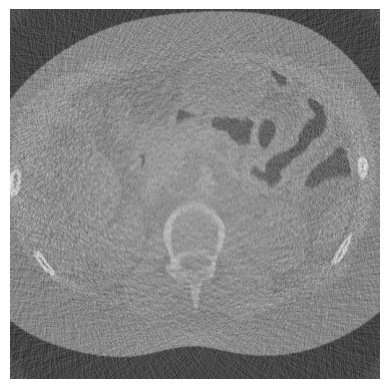

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt77/male_pt77_206_250mA_110kV_512x512x1.raw


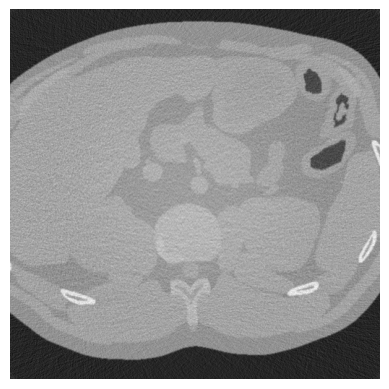

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_15yr_ref/female_15yr_ref_116_50mA_140kV_512x512x1.raw


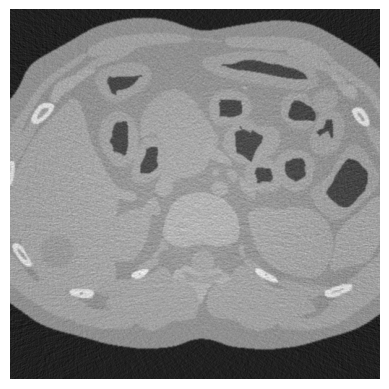

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt328/female_pt328_227_450mA_100kV_512x512x1.raw


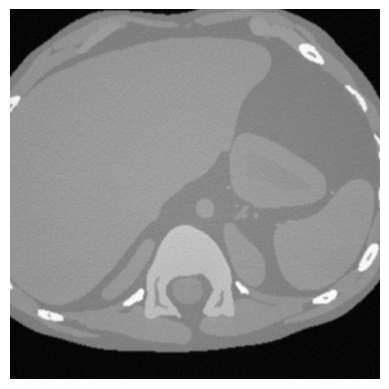

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt290/female_pt290_306_150mA_140kV_512x512x1.raw


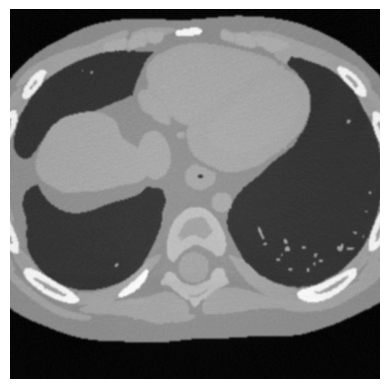

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_15yr_ref/male_15yr_ref_68_400mA_140kV_512x512x1.raw


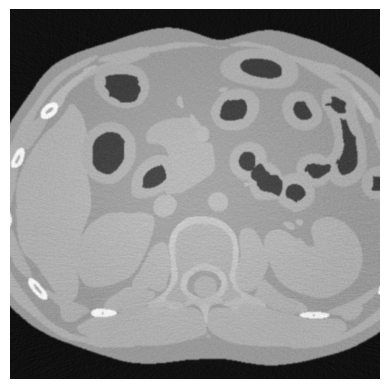

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_15yr_ref/male_15yr_ref_178_400mA_80kV_512x512x1.raw


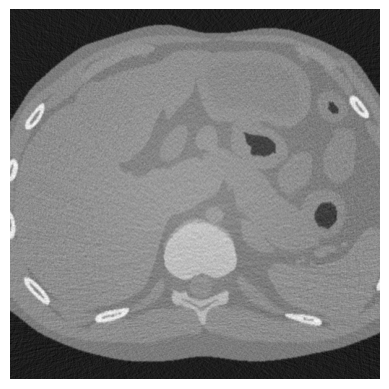

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt324/male_pt324_380_100mA_100kV_512x512x1.raw


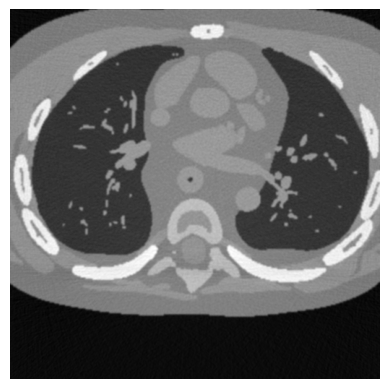

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt336/female_pt336_191_350mA_120kV_512x512x1.raw


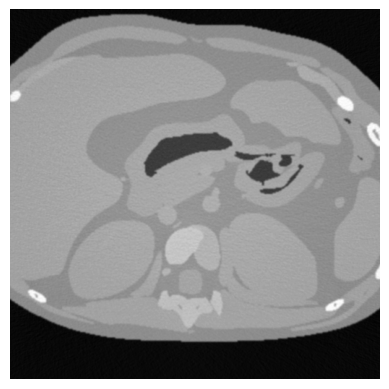

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_15yr_ref/male_15yr_ref_499_100mA_90kV_512x512x1.raw


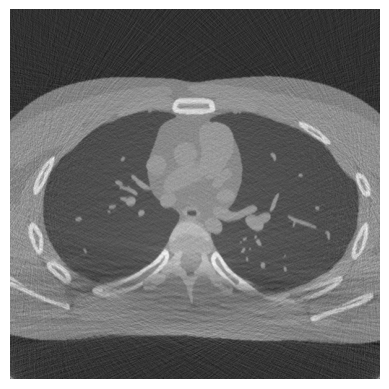

In [19]:
for i in range(10):
    im_name = summary['results_name'].iloc[i]
    print(im_name)
    image = load_volume(im_name)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

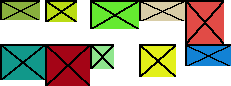

In [21]:
import numpy as np
from PIL import Image

def pil_grid(images, max_horiz=np.iinfo(int).max):
    n_images = len(images)
    n_horiz = min(n_images, max_horiz)
    h_sizes, v_sizes = [0] * n_horiz, [0] * (n_images // n_horiz)
    for i, im in enumerate(images):
        h, v = i % n_horiz, i // n_horiz
        h_sizes[h] = max(h_sizes[h], im.size[0])
        v_sizes[v] = max(v_sizes[v], im.size[1])
    h_sizes, v_sizes = np.cumsum([0] + h_sizes), np.cumsum([0] + v_sizes)
    im_grid = Image.new('RGB', (h_sizes[-1], v_sizes[-1]), color='white')
    for i, im in enumerate(images):
        im_grid.paste(im, (h_sizes[i % n_horiz], v_sizes[i // n_horiz]))
    return im_grid

def dummy(w, h):
    "Produces a dummy PIL image of given dimensions"
    from PIL import ImageDraw
    im = Image.new('RGB', (w, h), color=tuple((np.random.rand(3) * 255).astype(np.uint8)))
    draw = ImageDraw.Draw(im)
    points = [(i, j) for i in (0, im.size[0]) for j in (0, im.size[1])]
    for i in range(len(points) - 1):
        for j in range(i+1, len(points)):
            draw.line(points[i] + points[j], fill='black', width=2)
    return im

dummy_images = [dummy(20 + np.random.randint(30), 20 + np.random.randint(30)) for _ in range(10)]
pil_grid(dummy_images, 5)

In [22]:
def normalize(image): return 1 - (image.max() - image) / (image.max() - image.min())

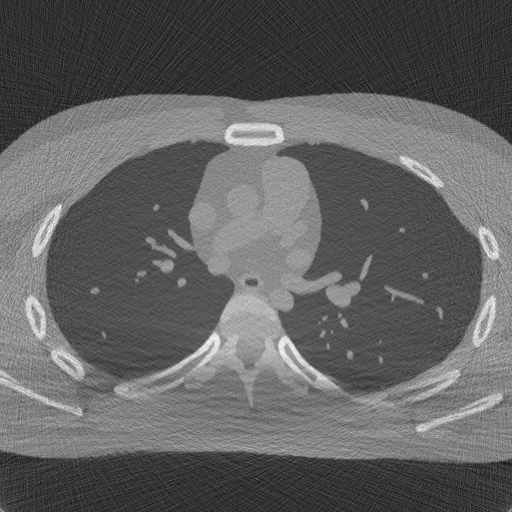

In [23]:
Image.fromarray((normalize(image[:,:,0])*255).astype('uint8'))

In [25]:
l_images = []
N = min(len(summary), 20)
for i in range(N):
    im_name = summary['results_name'].iloc[i]
    image = (normalize(load_volume(im_name)[:,:,0])*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, 4)

## Only show images with lesions

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt151/female_pt151_158_100mA_80kV_512x512x1.raw


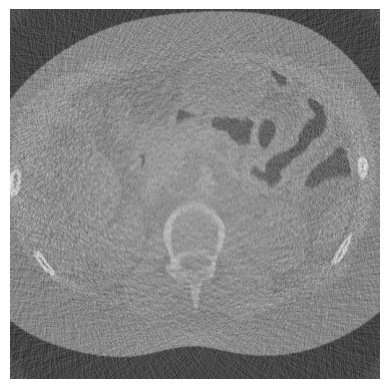

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_15yr_ref/female_15yr_ref_116_50mA_140kV_512x512x1.raw


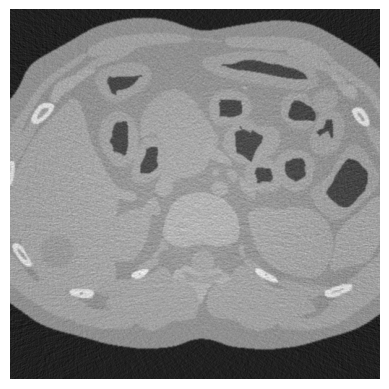

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt148/male_pt148_249_350mA_80kV_512x512x1.raw


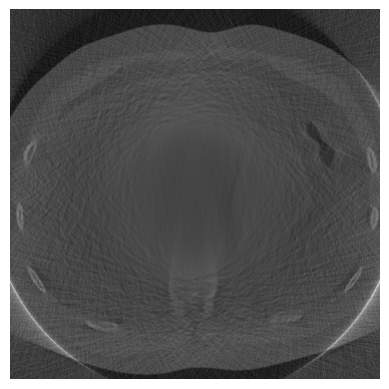

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt77/male_pt77_372_250mA_130kV_512x512x1.raw


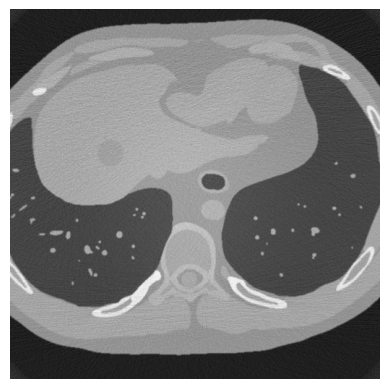

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt152/female_pt152_186_450mA_120kV_512x512x1.raw


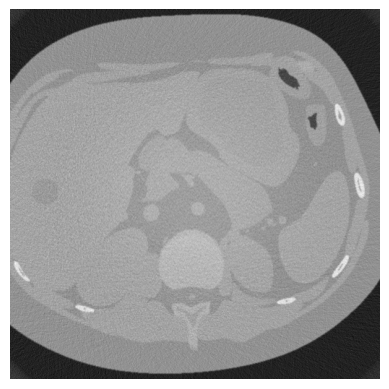

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt106/female_pt106_172_400mA_90kV_512x512x1.raw


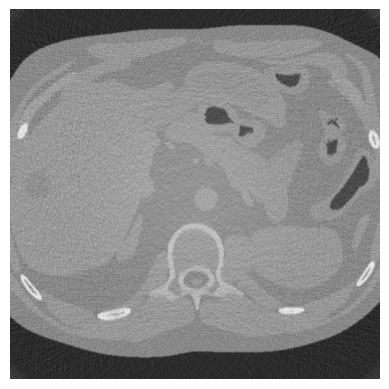

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt77/male_pt77_340_100mA_120kV_512x512x1.raw


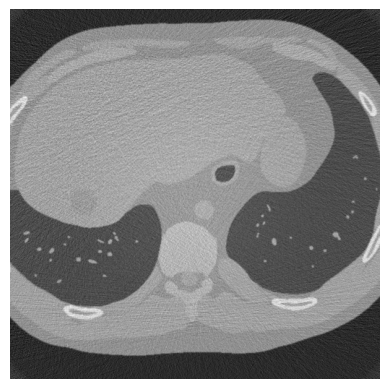

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_5yr_ref/male_5yr_ref_228_50mA_100kV_512x512x1.raw


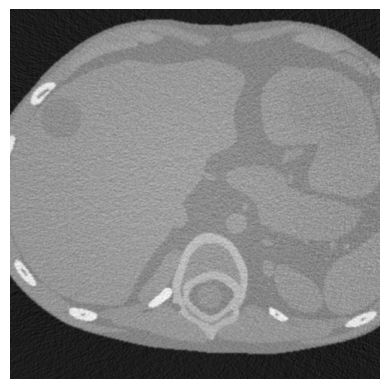

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt96/male_pt96_161_150mA_110kV_512x512x1.raw


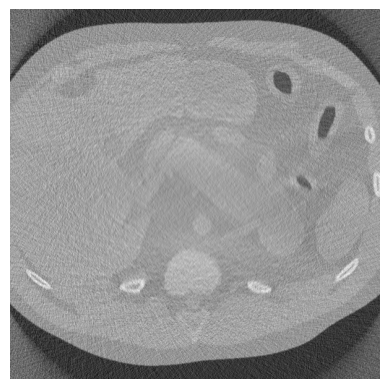

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt106/female_pt106_324_200mA_120kV_512x512x1.raw


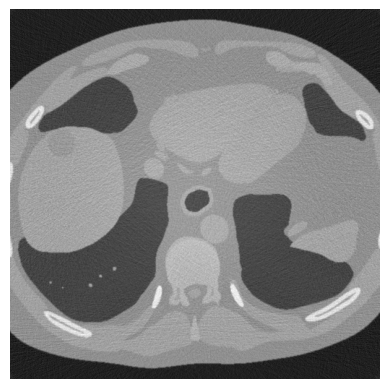

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_15yr_ref/female_15yr_ref_215_250mA_90kV_512x512x1.raw


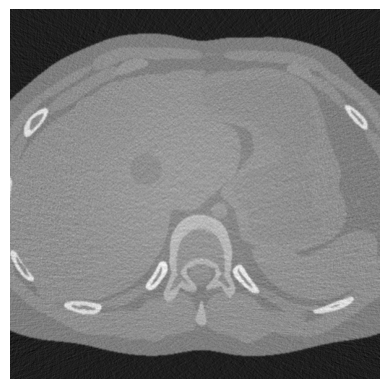

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt71/female_pt71_336_300mA_140kV_512x512x1.raw


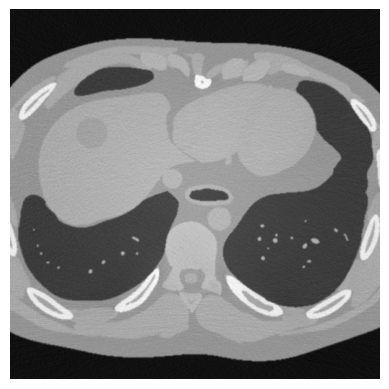

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt77/male_pt77_169_150mA_120kV_512x512x1.raw


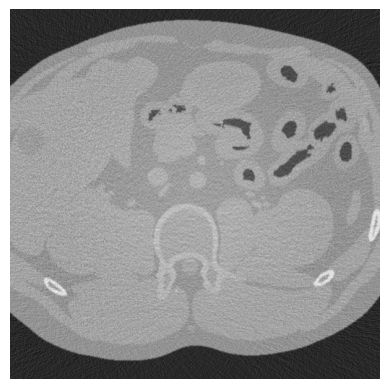

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt77/male_pt77_183_150mA_130kV_512x512x1.raw


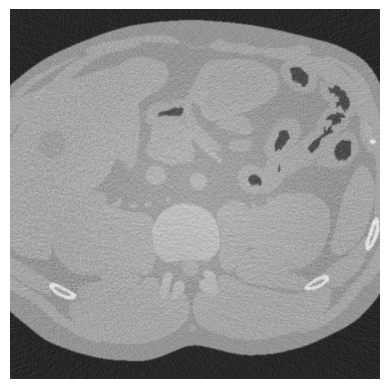

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt321/male_pt321_305_350mA_130kV_512x512x1.raw


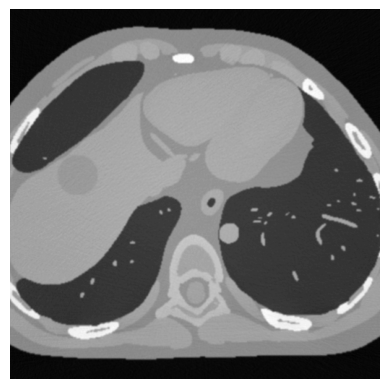

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt96/male_pt96_285_350mA_140kV_512x512x1.raw


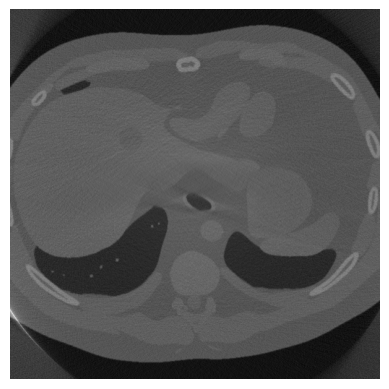

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt71/female_pt71_333_400mA_110kV_512x512x1.raw


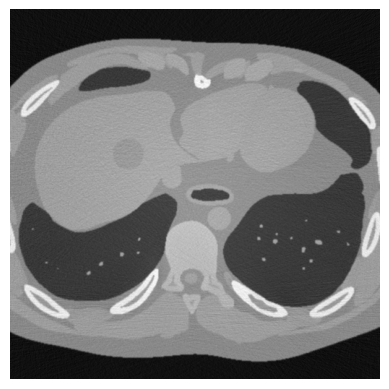

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt106/female_pt106_112_200mA_90kV_512x512x1.raw


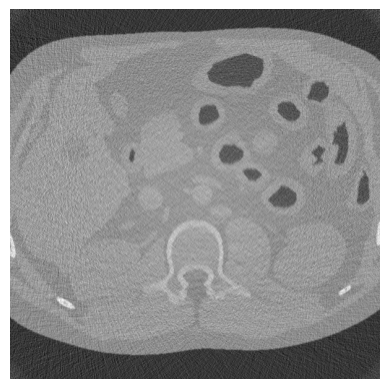

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/female_pt328/female_pt328_105_400mA_140kV_512x512x1.raw


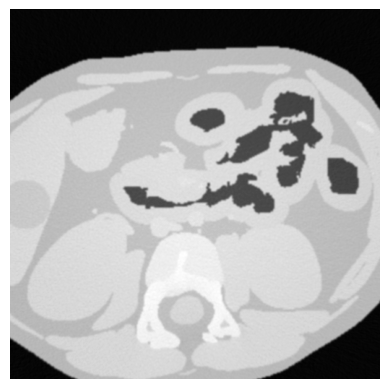

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt321/male_pt321_300_350mA_80kV_512x512x1.raw


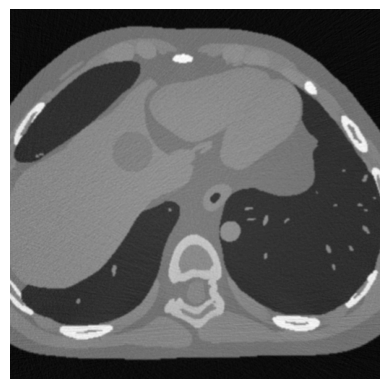

In [29]:
for i in range(20):
    im_name = summary[summary['lesion_name'].notna()]['results_name'].iloc[i]
    print(im_name)
    image = load_volume(im_name)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

In [34]:
import pydicom
from scipy.ndimage import zoom
from scipy.ndimage import affine_transform
idx=2
lesions_df = summary[summary['lesion_name'].notna()]
row = lesions_df.iloc[idx]
im_name = row['results_name']
lesion_name = row['lesion_name']

def get_ground_truth(lesion_name):
    lesion_name = Path(lesion_name)
    ground_truth_name = lesion_name.parents[1] / f"ground_truth_{lesion_name.stem.split('_')[1]}.dcm"
    return pydicom.read_file(ground_truth_name).pixel_array

image = load_volume(im_name, shape=(512,512))
gt = get_ground_truth(lesion_name)[::2, ::2]
print(im_name)
gt_lesion = pydicom.read_file(lesion_name).pixel_array[::2, ::2]
gt_lesion.shape, gt.shape, image.shape

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_11-36/simulations/male_pt148/male_pt148_249_350mA_80kV_512x512x1.raw


((512, 512), (512, 512), (512, 512))

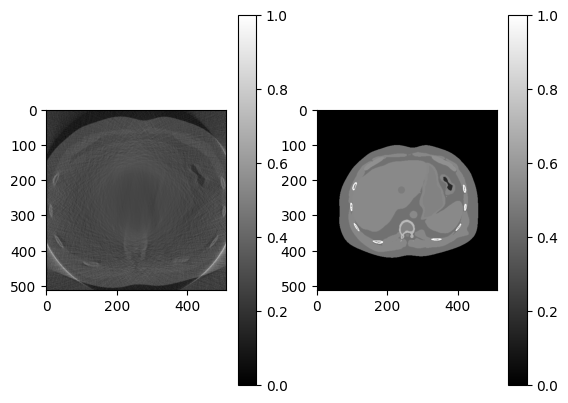

In [35]:
f, axs = plt.subplots(1,2)
im0 = axs[0].imshow(normalize(image), cmap='gray')
plt.colorbar(im0)
im1 = axs[1].imshow(normalize(gt), cmap='gray')
plt.colorbar(im1)

In [40]:
import cv2
def get_registration_transform(moving_img, ref_img):
    #from https://stackoverflow.com/questions/72907431/opencv-error-215assertion-failed-m0-type-cv-32f-m0-type-cv-64
    # Open the image files.
    img1 = (255*normalize(moving_img)).astype('uint8')  # Image to be aligned.
    img2 = (255*normalize(ref_img)).astype('uint8')   # Reference image.
    height, width = img2.shape

    # Create ORB detector with 5000 features.
    ## used to creates keypoints on the reference image
    orb_detector = cv2.ORB_create(5000)

    # Find keypoints and descriptors.
    # The first arg is the image, second arg is the mask
    #  (which is not required in this case).
    kp1, d1 = orb_detector.detectAndCompute(img1, None)
    kp2, d2 = orb_detector.detectAndCompute(img2, None)

    # Match features between the two images.
    # We create a Brute Force matcher with
    # Hamming distance as measurement mode.

    #Brute-Force matcher is simple. 
    #It takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned.
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Match the two sets of descriptors.
    matches = matcher.match(d1, d2)

    # Sort matches on the basis of their Hamming distance.
    matches = sorted(matches, key = lambda x:x.distance, reverse=False)

    # Take the top 90 % matches forward.
    matches = matches[:int(len(matches)*0.9)]
    no_of_matches = len(matches)

    # Define empty matrices of shape no_of_matches * 2.
    p1 = np.zeros((no_of_matches, 2))
    p2 = np.zeros((no_of_matches, 2))

    for i in range(len(matches)):
        p1[i, :] = kp1[matches[i].queryIdx].pt
        p2[i, :] = kp2[matches[i].trainIdx].pt

    # Find the homography matrix.
    homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
    return homography

In [43]:
def get_lesion_mask(im_name, lesion_name):
    image = load_volume(im_name, shape=(512,512))    
    gt = get_ground_truth(lesion_name)[::2, ::2]
    gt_lesion = pydicom.read_file(lesion_name).pixel_array[::2, ::2]
    
    transform = get_registration_transform(gt, image)
    
    gt_transformed = cv2.warpPerspective(gt, transform, gt.shape)
    lesion_transformed = cv2.warpPerspective(gt_lesion, transform, gt_lesion.shape)
    return lesion_transformed, gt_transformed

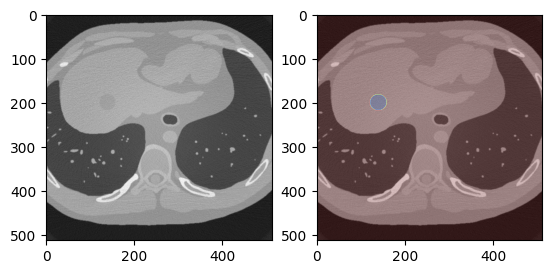

In [44]:
idx=3
row = lesions_df.iloc[idx]
lesion, ground_truth = get_lesion_mask(row['results_name'], row['lesion_name'])

image = load_volume(row['results_name'], shape=(512, 512))
f, axs = plt.subplots(1,2)
axs[0].imshow(image, cmap='gray')
axs[1].imshow(image, cmap='gray')
axs[1].imshow(lesion, alpha=0.2, cmap='jet')

If this doesnt work an easier alternative is cleaning up the CT code to do a quick recon of the lesion only

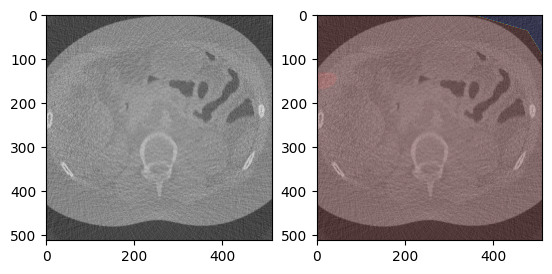

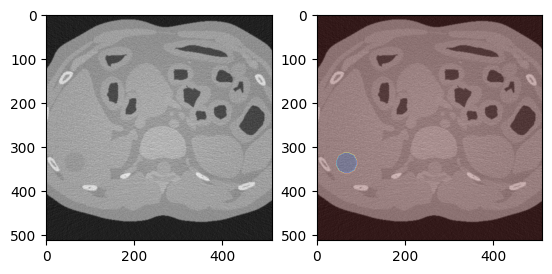

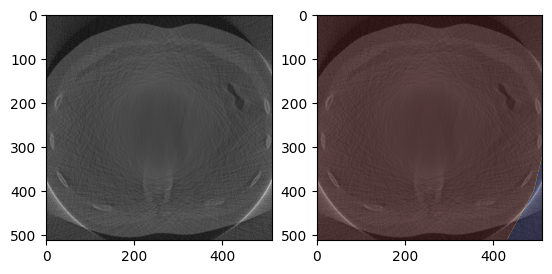

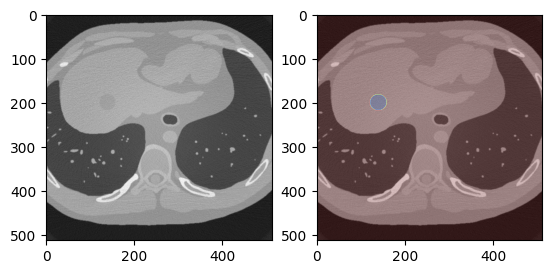

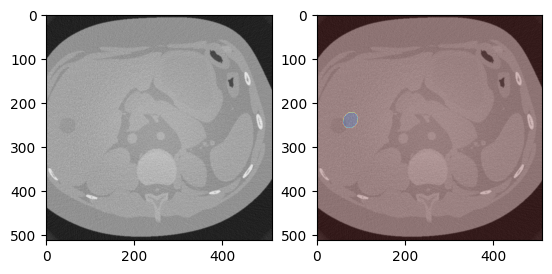

...

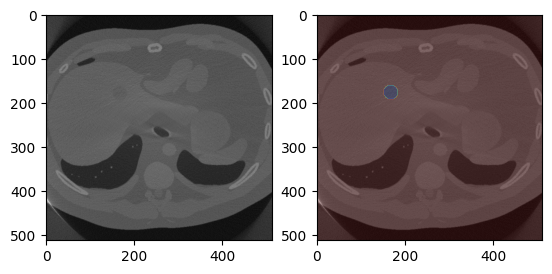

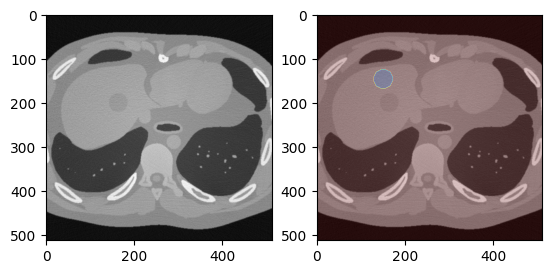

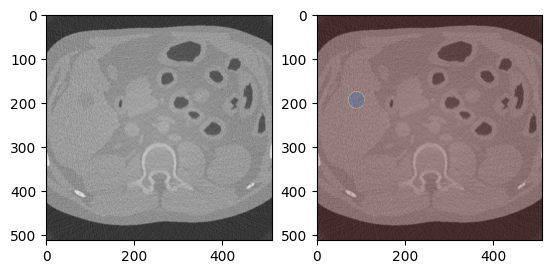

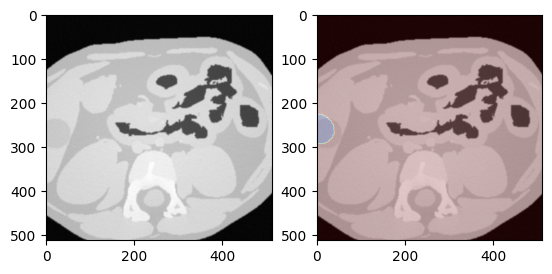

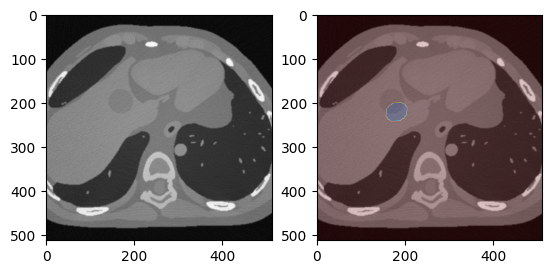

In [46]:
for i in range(20):
    row = lesions_df.iloc[i]
    lesion, ground_truth = get_lesion_mask(row['results_name'], row['lesion_name'])

    image = load_volume(row['results_name'], shape=(512, 512))
    f, axs = plt.subplots(1,2)
    axs[0].imshow(image, cmap='gray')
    axs[1].imshow(image, cmap='gray')
    axs[1].imshow(lesion, alpha=0.2, cmap='jet')
    plt.show()